# FENE beadspring with variable kuhn length experiment data analysis

In [17]:
import os

import plotly.colors

import polyflexmd.data_analysis.data.read as read
import polyflexmd.data_analysis.transform.transform as transform
import polyflexmd.data_analysis.theory.kremer_grest as kremer_grest
import polyflexmd.data_analysis.theory.rouse as rouse
import polyflexmd.data_analysis.plot.plot_system as plot_system
import polyflexmd.data_analysis.data.constants as data_constants
import polyflexmd.data_analysis.pipelines.trajectory as pipeline_process
import polyflexmd.experiment_runner.config as config
import polyflexmd.data_analysis.plot.msd as plot_msd
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import numpy as np
from pandarallel import pandarallel
import seaborn as sns
import scipy.optimize
import functools

In [18]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [107]:
sns.set_style("darkgrid")

SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

plt.rc('axes', titlesize=MEDIUM_SIZE)  # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc('ytick', labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)  # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


## Read and process data

In [20]:
PATH_EXPERIMENT = "/beegfs/ws/0/s4610340-polyflexmd/data/experiment_results/FENE-beadspring-vary-l_K/4-FENE-beadspring-vary-l_K/538accb2"
NAME_EC = "4-FENE-beadspring-vary-l_K.toml"
EQUILIBRIUM_ONLY = True
CONTINUE = False
CONTINUE_t_equilibrium = 58000000
N_WORKERS = 16
CHECK_BOND_LENGTHS = False

In [21]:
CONTINUE = bool(CONTINUE)
CONTINUE_t_equilibrium = int(CONTINUE_t_equilibrium)
EQUILIBRIUM_ONLY = bool(EQUILIBRIUM_ONLY)
CHECK_BOND_LENGTHS = bool(CHECK_BOND_LENGTHS)
PATH_EXPERIMENT = pathlib.Path(PATH_EXPERIMENT)
PATH_SYSTEM_DEF = PATH_EXPERIMENT / "data/initial_system.data"
PATH_EC = PATH_EXPERIMENT / NAME_EC
N_WORKERS = int(N_WORKERS)

### Read experiment config

In [22]:
conf = config.read_experiment_config(PATH_EC)
conf

ExperimentConfig(simulation_config=SimulationConfig(job=SlurmJobConfig(account='p_mdpolymer', time='96:00:00', partition='romeo', nodes=8, tasks_per_node=125, ntasks=1000, cpus_per_task=1, mem_per_cpu=1000), lammps_executable='/scratch/ws/0/s4610340-bt-eea1-md-workspace/bin/lammps-patch_23Jun2022_update4/lmp_omp_romeo_opt', lmod_modules='modenv/hiera GCC/11.3.0 OpenMPI/4.1.4 Python/3.9.6', simulation_model_path=PosixPath('simulations/FENE-beadspring-vary-l_K.lammps'), experiments_path=PosixPath('/beegfs/ws/0/s4610340-polyflexmd/data/experiment_results'), n_partitions=8, n_tasks_per_partition=125, variables={'kappa_start': 1.0, 'kappa_delta': 10, 'kappa_n_values': 8, 'n_relax_steps': 30000000, 'n_equilibrium_steps_1': 2000000, 'dump_frequency_1': 100, 'n_equilibrium_steps_2': 33000000, 'dump_frequency_2': 10000}), initial_system_config=SystemCreatorConfig(system_type='create', job=SlurmJobConfig(account='p_mdpolymer', time='1:00:00', partition='romeo', nodes=1, tasks_per_node=1, ntasks=

In [23]:
kappas: list[float] = [
    conf.simulation_config.variables["kappa_start"] + conf.simulation_config.variables["kappa_delta"] * i
    for i in range(conf.simulation_config.variables["kappa_n_values"])
]
kappas

[1.0, 11.0, 21.0, 31.0, 41.0, 51.0, 61.0, 71.0]

### Read initial system

In [24]:
system = read.read_lammps_system_data(PATH_SYSTEM_DEF)
system.atoms

,molecule-ID,type,x,y,z,ix,iy,iz
1,1,1,0.000000,0.000000,0.000000,0,0,0
2,1,1,-0.336178,0.186169,0.890632,0,0,0
3,1,2,-0.672356,0.372339,1.781264,0,0,0
4,1,2,-1.008534,0.558508,2.671896,0,0,0
5,1,2,-1.344712,0.744678,3.562528,0,0,0
...,...,...,...,...,...,...,...,...
31996,500,2,25.290807,-50.942120,-6.367762,0,0,0
31997,500,2,25.719465,-51.805546,-6.475690,0,0,0
31998,500,2,26.148122,-52.668972,-6.583618,0,0,0
31999,500,2,26.576780,-53.532397,-6.691547,0,0,0


In [25]:
system.box

-100.000000 100.000000  xlo xhi
-100.000000 100.000000  ylo yhi
-100.000000 100.000000  zlo zhi

### Read main-axis dataframe

In [26]:
PATH_DATA_PROCESSED = PATH_EXPERIMENT / "data" / "processed"
if CONTINUE:
    PATH_DATA_PROCESSED = PATH_DATA_PROCESSED / "continue"
PATH_DATA_PROCESSED

PosixPath('/beegfs/ws/0/s4610340-polyflexmd/data/experiment_results/FENE-beadspring-vary-l_K/4-FENE-beadspring-vary-l_K/538accb2/data/processed')

In [27]:
PATH_DF_MAIN_AXIS = PATH_DATA_PROCESSED / "main_axis.csv"
df_main_axis = pd.read_csv(PATH_DF_MAIN_AXIS).groupby("molecule-ID").nth(1)
df_main_axis

,molecule-ID,type,x,y,z,ix,iy,iz
1,1,1,-0.336178,0.186169,0.890632,0,0,0
3,2,1,-0.272215,-0.119898,0.923268,0,0,0
5,3,1,-0.517323,-0.532615,-0.624178,0,0,0
7,4,1,0.302546,-0.396453,0.831980,0,0,0
9,5,1,-0.592061,0.192979,0.743722,0,0,0
...,...,...,...,...,...,...,...,...
991,496,1,0.301950,-0.674609,-0.628195,0,0,0
993,497,1,-0.010688,0.215110,-0.945787,0,0,0
995,498,1,-0.072238,0.104175,0.961680,0,0,0
997,499,1,-0.396090,-0.883587,0.057330,0,0,0


## Calculate and plot observables

In [28]:
l_b_src = .97
L_src = l_b_src * (conf.initial_system_config.system_config.n_monomers - 1)
L_src

61.11

### End-to-End distance $\vec{R}$

In [29]:
PATH_ETE = PATH_DATA_PROCESSED / "ete.csv"
df_ete = pd.read_csv(PATH_ETE, index_col=["kappa", "molecule-ID", "t"])
df_ete

R_x       R_y        R_z          R
kappa molecule-ID t                                                  
1.0   1           30000000   4.653390   7.51274   7.235560  11.421411
      2           30000000   5.183050   2.47633   9.489370  11.092537
      3           30000000   4.879620  -1.24165   8.614230   9.977843
      4           30000000   0.573486  -4.00533   3.909040   5.626024
      5           30000000  -2.084040  -6.83918   0.227633   7.153281
...                               ...       ...        ...        ...
71.0  496         65000000  32.172900 -46.69850 -10.628500  57.695847
      497         65000000  19.717800  37.38680 -38.115400  56.915268
      498         65000000 -42.031100  -7.32022  25.061500  49.480076
      499         65000000 -25.478400 -50.98580  15.163900  58.980034
      500         65000000  46.443500 -29.78540   7.322810  55.657818

[93204000 rows x 4 columns]

In [30]:
df_ete["t/LJ"] = df_ete.index.get_level_values("t").map(lambda x: x * 0.0025)
df_ete["R^2"] = df_ete["R"] ** 2
df_ete

R_x       R_y        R_z          R  \
kappa molecule-ID t                                                     
1.0   1           30000000   4.653390   7.51274   7.235560  11.421411   
      2           30000000   5.183050   2.47633   9.489370  11.092537   
      3           30000000   4.879620  -1.24165   8.614230   9.977843   
      4           30000000   0.573486  -4.00533   3.909040   5.626024   
      5           30000000  -2.084040  -6.83918   0.227633   7.153281   
...                               ...       ...        ...        ...   
71.0  496         65000000  32.172900 -46.69850 -10.628500  57.695847   
      497         65000000  19.717800  37.38680 -38.115400  56.915268   
      498         65000000 -42.031100  -7.32022  25.061500  49.480076   
      499         65000000 -25.478400 -50.98580  15.163900  58.980034   
      500         65000000  46.443500 -29.78540   7.322810  55.657818   

                                t/LJ          R^2  
kappa molecule-ID t                                
1.0   1           30000000   75000.0   130.448641  
      2           30000000   75000.0   123.044377  
      3           30000000   75000.0    99.557351  
      4           30000000   75000.0    31.652148  
      5           30000000   75000.0    51.169425  
...                              ...          ...  
71.0  496         65000000  162500.0  3328.810761  
      497         65000000  162500.0  3239.347732  
      498         65000000  162500.0  2448.277921  
      499         65000000  162500.0  3478.644411  
      500         65000000  162500.0  3097.792705  

[93204000 rows x 6 columns]

R_x       R_y        R_z          R  \
kappa molecule-ID t                                                     
1.0   1           30000000   4.653390   7.51274   7.235560  11.421411   
      2           30000000   5.183050   2.47633   9.489370  11.092537   
      3           30000000   4.879620  -1.24165   8.614230   9.977843   
      4           30000000   0.573486  -4.00533   3.909040   5.626024   
      5           30000000  -2.084040  -6.83918   0.227633   7.153281   
...                               ...       ...        ...        ...   
71.0  496         65000000  32.172900 -46.69850 -10.628500  57.695847   
      497         65000000  19.717800  37.38680 -38.115400  56.915268   
      498         65000000 -42.031100  -7.32022  25.061500  49.480076   
      499         65000000 -25.478400 -50.98580  15.163900  58.980034   
      500         65000000  46.443500 -29.78540   7.322810  55.657818   

                                t/LJ          R^2  
kappa molecule-ID t                                
1.0   1           30000000   75000.0   130.448641  
      2           30000000   75000.0   123.044377  
      3           30000000   75000.0    99.557351  
      4           30000000   75000.0    31.652148  
      5           30000000   75000.0    51.169425  
...                              ...          ...  
71.0  496         65000000  162500.0  3328.810761  
      497         65000000  162500.0  3239.347732  
      498         65000000  162500.0  2448.277921  
      499         65000000  162500.0  3478.644411  
      500         65000000  162500.0  3097.792705  

[93204000 rows x 6 columns]

In [31]:
df_ete_mean = df_ete.groupby(["kappa", "t"])[["R^2"]].mean()
df_ete_mean["l_K"] = kremer_grest.bare_kuhn_length(
    np.array(df_ete_mean.index.get_level_values("kappa")),
    l_b=l_b_src
)
df_ete_mean

R^2         l_K
kappa t                                
1.0   30000000   121.753577    1.854017
      30000100   122.022246    1.854017
      30000200   122.315529    1.854017
      30000300   122.462672    1.854017
      30000400   122.593975    1.854017
...                     ...         ...
71.0  64960000  2825.152344  136.770000
      64970000  2824.566295  136.770000
      64980000  2816.356893  136.770000
      64990000  2804.853668  136.770000
      65000000  2797.986697  136.770000

[186408 rows x 2 columns]

R^2         l_K
kappa t                                
1.0   30000000   121.753577    1.854017
      30000100   122.022246    1.854017
      30000200   122.315529    1.854017
      30000300   122.462672    1.854017
      30000400   122.593975    1.854017
...                     ...         ...
71.0  64960000  2825.152344  136.770000
      64970000  2824.566295  136.770000
      64980000  2816.356893  136.770000
      64990000  2804.853668  136.770000
      65000000  2797.986697  136.770000

[186408 rows x 2 columns]

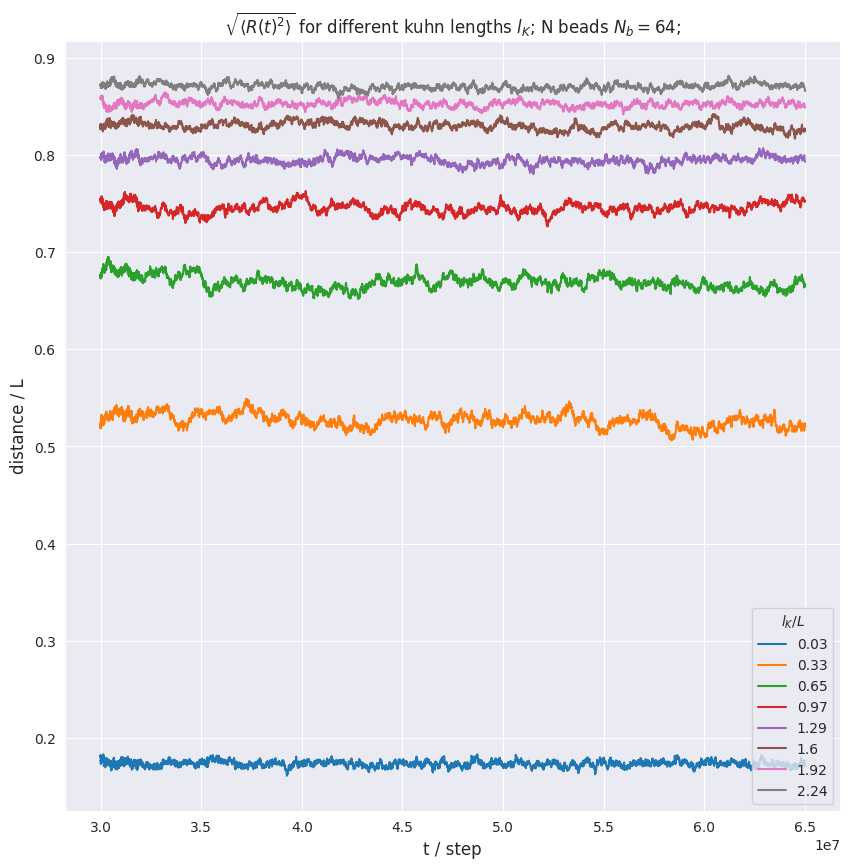

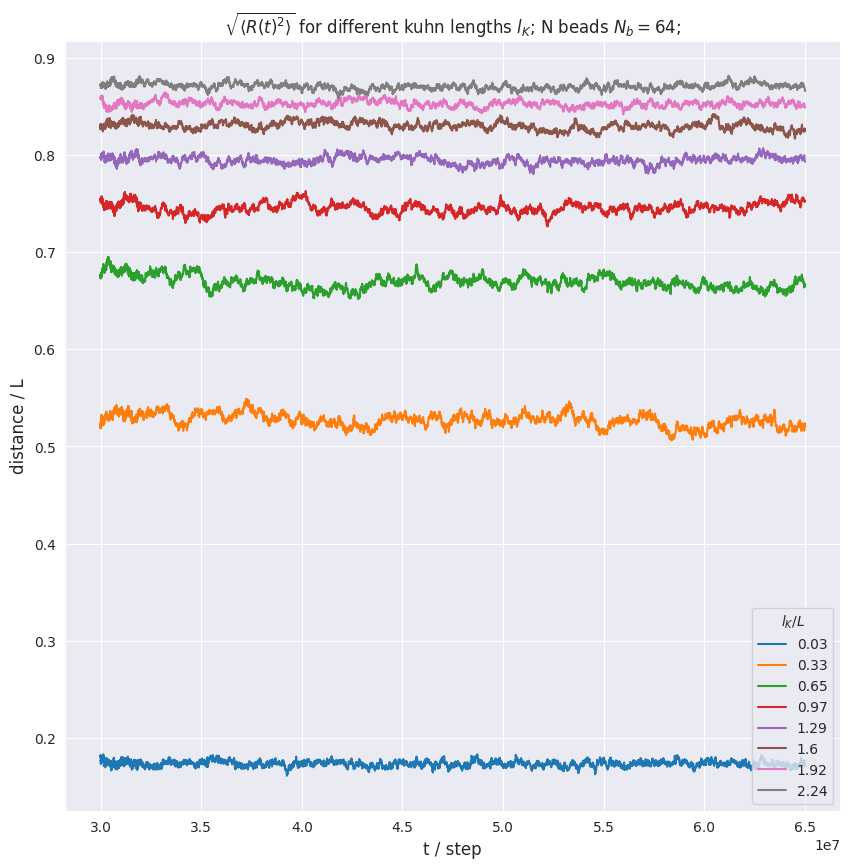

In [32]:
kappa_colors = sns.color_palette(n_colors=len(kappas))

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(10, 10))
ax.set(
    title=f'$\sqrt{{\\langle R(t)^2 \\rangle }}$ for different kuhn lengths $l_K$; '
          f'N beads $N_b={conf.initial_system_config.system_config.n_monomers}$;',
    ylabel="distance / L",
    xlabel="t / step"
)

sns.lineplot(
    x=df_ete_mean.index.get_level_values("t"),
    y=np.sqrt(df_ete_mean["R^2"]) / L_src,
    hue=(df_ete_mean["l_K"] / L_src).round(2).astype("category"),
    color=kappa_colors,
    ax=ax
)

ax.get_legend().set_title("$l_K/L$")

## Equilibrium statistics

In [33]:
t_equilibrium = conf.simulation_config.variables["n_relax_steps"] if not CONTINUE else CONTINUE_t_equilibrium
t_equilibrium

30000000

### Mean bond length

In [34]:
l_b = conf.initial_system_config.system_config.bond_length
l_b

0.97

### Mean contour length

In [35]:
L_contour = l_b * (conf.initial_system_config.system_config.n_monomers - 1)
L_contour

61.11

### Kuhn lengths

Svaneborg (8)

In [36]:
l_ks = kremer_grest.bare_kuhn_length(np.array(kappas), l_b)
l_ks

array([  1.85401695,  20.37000013,  39.77      ,  59.17      ,
        78.57      ,  97.97      , 117.37      , 136.77      ])

Estimate from fit (Worm-like chain model, Hinczewski):

In [37]:
PATH_L_K_ESTIMATE = PATH_DATA_PROCESSED / "l_K-estimate.csv"
l_ks_estimate = pd.read_csv(PATH_L_K_ESTIMATE, index_col="kappa")
l_ks_estimate

,t,l_K,d_l_K
kappa,,,
1.0,30000000,1.686888,0.026178
11.0,30000000,20.290522,0.105991
21.0,30000000,40.452802,0.136657
31.0,30000000,61.616077,0.127580
41.0,30000000,78.770816,0.110465
...,...,...,...
31.0,65000000,60.772934,0.111231
41.0,65000000,76.998405,0.134249
51.0,65000000,94.909123,0.248108


In [38]:
def aggregate_l_K_estimate(df: pd.DataFrame):
    l_K = df["l_K"].mean()
    d_l_K = df["l_K"] = df["l_K"].std() * 3
    return pd.Series([l_K, d_l_K], index=["l_K", "d_l_K"])


l_ks_estimate_agg = l_ks_estimate.groupby("kappa").apply(aggregate_l_K_estimate)
l_ks_estimate_agg

,l_K,d_l_K
kappa,,
1.0,1.671224,0.046628
11.0,20.627271,1.062030
21.0,41.584460,4.017132
31.0,59.914476,5.426656
41.0,78.868018,6.045823
51.0,100.996739,8.289396
61.0,116.013684,10.383716
71.0,139.463155,12.719022


In [39]:
l_ks_estimate_agg / L_contour

,l_K,d_l_K
kappa,,
1.0,0.027348,0.000763
11.0,0.337543,0.017379
21.0,0.680485,0.065736
31.0,0.980437,0.088801
41.0,1.290591,0.098933
51.0,1.652704,0.135647
61.0,1.898440,0.169918
71.0,2.282166,0.208133


Difference of analytical l_K and estimated l_K relative to analytical l_K

In [40]:
np.abs(l_ks - l_ks_estimate_agg["l_K"]) / l_ks

kappa
1.0     0.098593
11.0    0.012630
21.0    0.045624
31.0    0.012582
41.0    0.003793
51.0    0.030895
61.0    0.011556
71.0    0.019691
Name: l_K, dtype: float64

### Number of Kuhn segments $N_K$

Estimate $N_K = L / l_K$ as in Svaneborg (6)

In [41]:
N_Ks = (L_contour / l_ks)
N_Ks

array([32.96086365,  2.99999998,  1.53658537,  1.03278689,  0.77777778,
        0.62376238,  0.52066116,  0.44680851])

### End-to-End distance squared $\langle R^2 \rangle$

Estimate $\langle R^2 \rangle$ as average over ensemble and then over time in equilibrium

In [42]:
df_ete_sq_t_mean_kappas = transform.calculate_ete_sq_t_avg_df_kappas(df_ete_mean, t_equilibrium)
df_ete_sq_t_mean_kappas

,R^2
kappa,
1.0,113.404773
11.0,1054.448004
21.0,1721.416559
31.0,2099.449019
41.0,2369.805322
51.0,2589.951859
61.0,2708.717934
71.0,2844.979417


### Summarize statistics by kappas

In [43]:
df_kuhn_summary = pd.DataFrame({
    "R^2": df_ete_sq_t_mean_kappas["R^2"],
    "N_K": N_Ks,
    "l_K": l_ks
}, index=df_ete_sq_t_mean_kappas.index)
df_kuhn_summary

,R^2,N_K,l_K
kappa,,,
1.0,113.404773,32.960864,1.854017
11.0,1054.448004,3.000000,20.370000
21.0,1721.416559,1.536585,39.770000
31.0,2099.449019,1.032787,59.170000
41.0,2369.805322,0.777778,78.570000
51.0,2589.951859,0.623762,97.970000
61.0,2708.717934,0.520661,117.370000
71.0,2844.979417,0.446809,136.770000


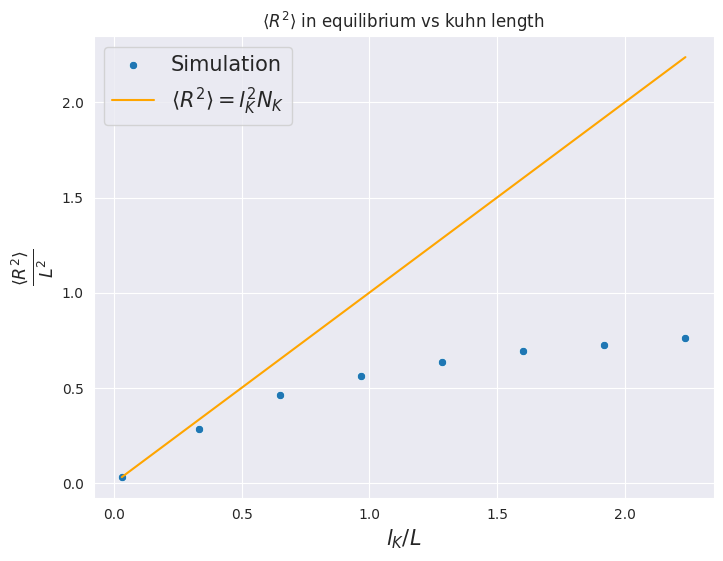

In [44]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.scatterplot(
    x=df_kuhn_summary["l_K"] / L_contour,
    y=df_kuhn_summary["R^2"] / L_contour ** 2,
    ax=ax,
    label="Simulation"
)

sns.lineplot(
    x=df_kuhn_summary["l_K"] / L_contour,
    y=(df_kuhn_summary["l_K"] ** 2 * N_Ks) / L_contour ** 2,
    label=r"$\langle R^2 \rangle = l_K^2 N_K$",
    color="orange"
)

ax.set(
    title=r"$\langle R^2 \rangle$ in equilibrium vs kuhn length",
    xlabel="$l_K / L$",
    ylabel=r"$\frac{\langle R^2 \rangle}{L^2}$"
)

ax.legend(fontsize=15)
ax.xaxis.get_label().set_fontsize(15)
ax.yaxis.get_label().set_fontsize(18)

In [45]:
df_kuhn_summary["l_K"] ** 2 * df_kuhn_summary["N_K"] / df_kuhn_summary["R^2"]

kappa
1.0     0.999067
11.0    1.180533
21.0    1.411828
31.0    1.722299
41.0    2.026079
51.0    2.311605
61.0    2.647925
71.0    2.937812
dtype: float64

### ETE change $ \langle (\Delta R(t))^2 \rangle $

In [70]:
import polyflexmd.data_analysis.transform.msd as msd

In [75]:
df_msd = msd.calculate_msd_df(df_ete, ["kappa"])

In [76]:
df_msd["t/LJ"] = df_msd.index.map(lambda t: t * 0.0025)
df_msd["l_K"] = kremer_grest.bare_kuhn_length(df_msd["kappa"], l_b=l_b)
df_msd

,dR^2,delta dR^2,kappa,t/LJ,l_K
t,,,,,
30000000,0.000000,0.000000,1.0,75000.00,1.854017
30000100,0.131123,0.000682,1.0,75000.25,1.854017
30000200,0.469626,0.002258,1.0,75000.50,1.854017
30000300,0.925409,0.004387,1.0,75000.75,1.854017
30000400,1.451558,0.007021,1.0,75001.00,1.854017
...,...,...,...,...,...
64960000,2170.061793,10.528699,71.0,162400.00,136.770000
64970000,2165.468234,10.575971,71.0,162425.00,136.770000
64980000,2169.143304,10.571658,71.0,162450.00,136.770000


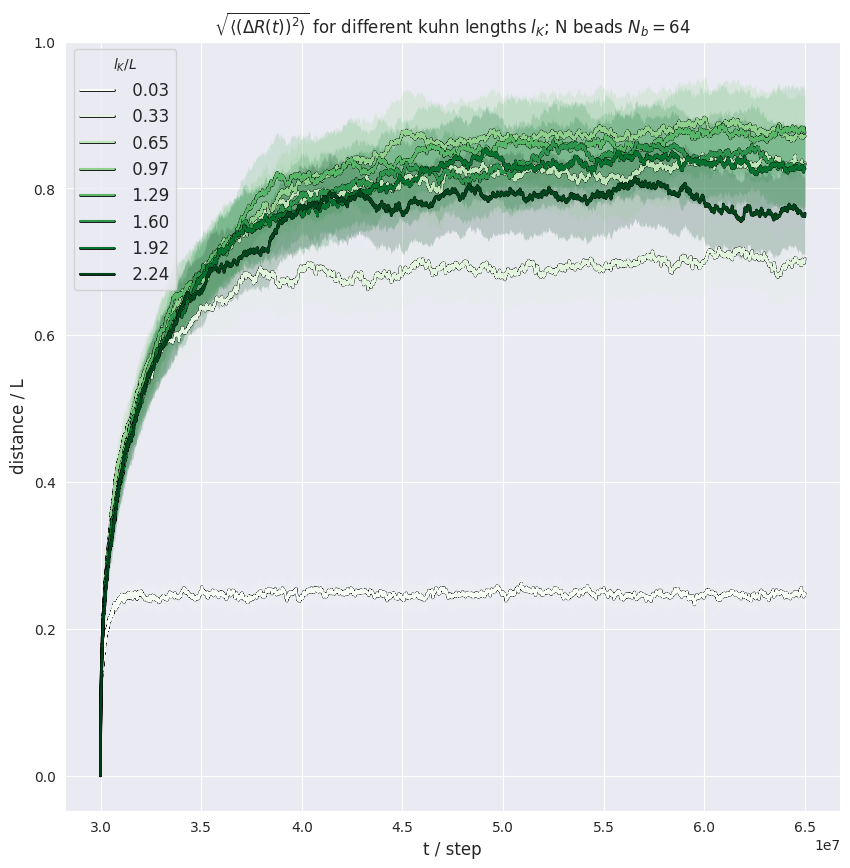

In [111]:
import matplotlib.patheffects as pe

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(10, 10))
ax.set(
    title=f'$ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} $ for different kuhn lengths $l_K$; '
          f'N beads $N_b={conf.initial_system_config.system_config.n_monomers}$',
    ylabel="distance / L",
    xlabel="t / step"
)

cs = plt.get_cmap("Greens")((l_ks - l_ks.min()) / (l_ks.max() - l_ks.min()))

for i, (kappa, df_kappa) in enumerate(df_msd.groupby("kappa")):
    y = np.sqrt(df_kappa["dR^2"]) / L_contour
    dy = np.sqrt(df_kappa["delta dR^2"]) / L_contour
    ax.plot(
        df_kappa.index.get_level_values("t"),
        y,
        c=cs[i],
        label = f"{kremer_grest.bare_kuhn_length(kappa, l_b) / L_contour : .2f}",
        path_effects=[pe.Stroke(linewidth=2, foreground='black'), pe.Normal()]
    )
    ax.fill_between(
        x = df_kappa.index.get_level_values("t"),
        y1 = y-dy,
        y2 = y+dy,
        color=cs[i],
        alpha=.2,
        linewidth=0
    )

ax.legend()
ax.get_legend().set_title("$l_K/L$")

## Explore MSD

### Loglog scale

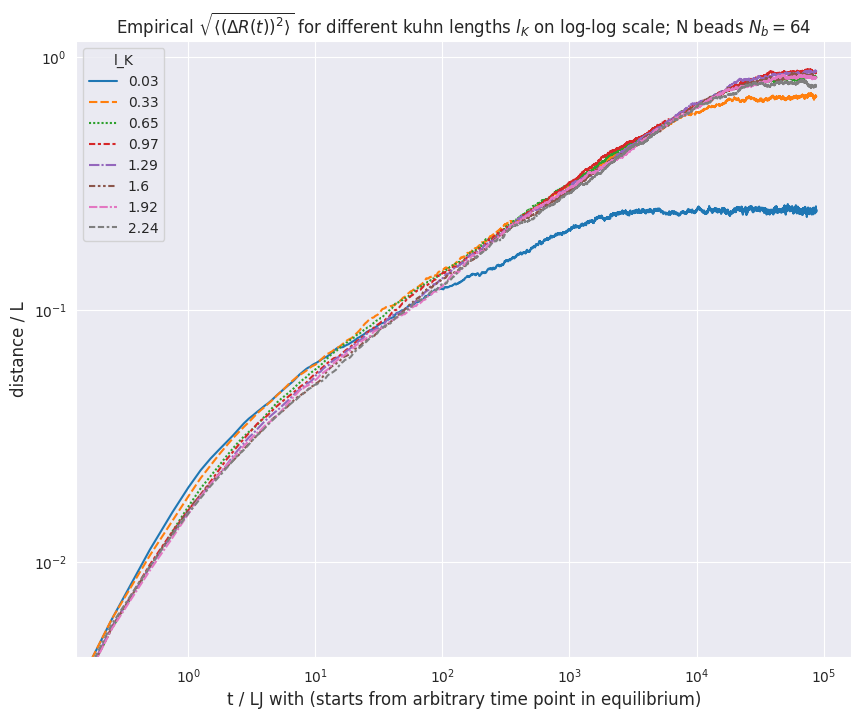

In [65]:
import matplotlib.ticker

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(10, 8))

plot = sns.lineplot(
    x=df_ete_change_kappas_equi["t/LJ"],
    y=np.sqrt(df_ete_change_kappas_equi["dR^2"]) / L_contour,
    hue=(df_ete_change_kappas_equi["l_K"] / L_contour).round(2).astype("category"),
    color=kappa_colors,
    style=(df_ete_change_kappas_equi["l_K"] / L_contour).round(2).astype("category"),
    ax=ax
)

_ = ax.set(
    yscale="log",
    xscale="log",
    title=f'Empirical $ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} $ for different kuhn lengths $l_K$ on log-log scale; '
          f'N beads $N_b={conf.initial_system_config.system_config.n_monomers}$',
    ylabel="distance / L",
    xlabel="t / LJ with (starts from arbitrary time point in equilibrium)"
)


In [67]:
import plotly.express as px


def plot_msd_plotly(df_msd_kappas: pd.DataFrame, log: bool = False):
    df = df_msd_kappas.copy()

    dR_col = "$ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} / L$"
    df[dR_col] = np.sqrt(df["dR^2"]) / L_contour

    l_K_col = "$l_K/L$"
    df[l_K_col] = (df["l_K"] / L_contour).round(2).astype("category")

    fig = px.scatter(
        df,
        x="t/LJ",
        y=dR_col,
        color=l_K_col,
        log_x=log,
        log_y=log,
        title=f'$\\text{{Empirical}} \sqrt {{\langle (\Delta R(t))^2 \\rangle}} \\text{{for different kuhn lengths l_K on log-log scale; N beads}} $N_b={conf.initial_system_config.system_config.n_monomers}$',
        labels={
            dR_col: "$\\text{distance} / L$"
        },
        height=800,
        color_discrete_sequence=px.colors.DEFAULT_PLOTLY_COLORS
    )

    return fig


plot_msd_plotly(df_ete_change_kappas_equi, log=True).show()

## Research different dimensions of MSD

In [68]:
df_ete_main_ax_frame = transform.change_basis_df_ete(df_ete, df_main_axis)
df_ete_main_ax_frame

,,,R_x,R_y,R_z,R,t/LJ,R^2
kappa,molecule-ID,t,,,,,,
1.0,1,30000000,7.352342,-5.873343,6.472676,11.421411,75000.0,130.448641
11.0,1,30000000,0.301723,6.699914,6.187263,9.124806,75000.0,83.262085
21.0,1,30000000,14.893539,20.632757,-17.874411,31.096989,75000.0,967.022725
31.0,1,30000000,40.844770,7.508727,6.804286,42.082950,75000.0,1770.974681
41.0,1,30000000,-10.612842,-9.343206,50.099404,52.056490,75000.0,2709.878151
...,...,...,...,...,...,...,...,...
31.0,500,65000000,-46.747730,-22.830154,3.035810,52.113170,162500.0,2715.782487
41.0,500,65000000,23.882994,1.803430,-5.087860,24.485426,162500.0,599.536086
51.0,500,65000000,38.260428,-4.190383,40.148024,55.617300,162500.0,3093.284059


In [ ]:
df_msd_by_dim = transform.calculate_msd_by_dimension_df(
    df_ete=df_ete_main_ax_frame,
    group_by_params=["kappa"]
)
df_msd_by_dim["t/LJ"] = df_msd_by_dim.index.get_level_values("t").map(lambda t: t * 0.0025)
df_msd_by_dim["t/LJ"] = df_msd_by_dim["t/LJ"] - df_msd_by_dim["t/LJ"].min()
df_msd_by_dim

### Different dimensions of same l_K

In [ ]:
fig: plt.Figure
fig, axs = plt.subplots(nrows=len(kappas), ncols=1, figsize=(7, 6 * len(kappas)))
dimensions = ["x", "y", "z"]

for (kappa, df_g), ax in zip(df_msd_by_dim.groupby("kappa"), axs):
    for dim in dimensions:
        plot_msd.plot_MSD(
            df_g,
            log_scale=True,
            l_K=kremer_grest.bare_kuhn_length(kappa, l_b),
            L_contour=L_contour,
            zeta=1,
            zeta_e=1,
            col=f"dR_{dim}^2",
            ax=ax,
            label=dim
        )

### Different l_Ks of same dimension

In [ ]:
fig: plt.Figure
fig, axs = plt.subplots(nrows=len(dimensions), ncols=1, figsize=(7, 6 * len(dimensions)))


def _plot(ax, dim):
    l_Ks = (kremer_grest.bare_kuhn_length(df_msd_by_dim["kappa"], l_b) / L_contour).round(2).astype("category").rename(
        "l_K/L")
    x = df_msd_by_dim["t/LJ"]
    y = np.sqrt(df_msd_by_dim[f"dR_{dim}^2"]) / L_contour

    sns.scatterplot(
        x=x,
        y=y,
        hue=l_Ks,
        color=kappa_colors,
        ax=ax
    )

    ax.set(ylabel="distance/L", title=f"MSD {dim}")


for dim, ax in zip(dimensions, axs):
    _plot(ax, dim)


## Compare with Rouse model


### Analytical $\tau_R$

Svaneborg (15)

Rouse relaxation time:
$$ \tau_R = \frac{1}{3 \pi^2} \frac{\zeta_K N_K l_K^2}{k_B T} = \frac{1}{3 \pi^2} \frac{\zeta N_b N_K l_K^2}{k_B T}$$
Relaxation time of single bead:
$$ \tau_0 = \frac{3 \pi^2 \tau_R}{N_K^2} $$

In [ ]:
zeta = 1  # LJ
T = 1
k_B = 1
alpha = 4.047

rouse_times_analytical = []
for i, (l_K, N_K, R_sq) in enumerate(zip(df_kuhn_summary["l_K"], df_kuhn_summary["N_K"], df_kuhn_summary["R^2"])):
    tau_R_analytical = zeta * conf.initial_system_config.system_config.n_monomers * N_K * l_K ** 2 / (
                3 * np.pi ** 2 * k_B * T)
    tau_R_analytical_corrected = tau_R_analytical * alpha
    rouse_times_analytical.append(tau_R_analytical_corrected)

df_rouse_times_theory = pd.DataFrame({
    "l_K": df_kuhn_summary["l_K"],
    "N_K": df_kuhn_summary["N_K"],
    "Theory tau_R": rouse_times_analytical,
    "Theory tau_0": rouse_times_analytical / df_kuhn_summary["N_K"] ** 2
}, index=df_kuhn_summary.index)

df_rouse_times_theory

In [ ]:
import matplotlib.legend

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(10, 10))
ax.set(
    title=f'Comparison empirical $ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} $ with Rouse model for different kuhn lengths $l_K$; '
          f'N beads $N_b={conf.initial_system_config.system_config.n_monomers}$',
    ylabel="distance / L",
    xlabel="t / LJ with (starts from arbitrary time point in equilibrium)"
)

plot = sns.scatterplot(
    x=df_ete_change_kappas_equi["t/LJ"],
    y=np.sqrt(df_ete_change_kappas_equi["dR^2"]) / L_contour,
    hue=(df_ete_change_kappas_equi["l_K"] / L_contour).round(2).astype("category"),
    color=kappa_colors,
    style=(df_ete_change_kappas_equi["l_K"] / L_contour).round(2).astype("category"),
    ax=ax
)

lines = []
labels = []

for i, (l_K, N_K, tau_R) in enumerate(
        zip(df_rouse_times_theory["l_K"], df_rouse_times_theory["N_K"], df_rouse_times_theory["Theory tau_R"])):
    ts = df_ete_change_kappas_equi["t/LJ"].unique()

    rouse_predictions = rouse.rouse_g_4(
        t=ts,
        tau_R=tau_R,
        p_max=conf.initial_system_config.system_config.n_monomers,
        N_b=N_K,
        l_b=l_K
    )
    line = ax.plot(
        ts,
        np.sqrt(rouse_predictions) / L_contour,
        color=kappa_colors[i]
    )
    lines.append(line)
    labels.append(f"$\sqrt{{g_4(t)}}$ for $l_K/L = {np.round(l_K / L_contour, 2)}$")

In [ ]:
df_rouse_times_theory

### Fit $\tau_R$

In [ ]:

df_rouse_times_fit = []

for i, (kappa, df_ete_change_kappas_equi_kappa) in enumerate(df_ete_change_kappas_equi.groupby("kappa")):
    l_K = df_kuhn_summary.loc[kappa]["l_K"]
    N_K = df_kuhn_summary.loc[kappa]["N_K"]
    popt, pcov = scipy.optimize.curve_fit(
        functools.partial(rouse.rouse_g_4, N_b=N_K, l_b=l_K, p_max=conf.initial_system_config.system_config.n_monomers),
        df_ete_change_kappas_equi_kappa.loc[df_ete_change_kappas_equi_kappa["t/LJ"] < 1e4]["t/LJ"],
        df_ete_change_kappas_equi_kappa[df_ete_change_kappas_equi_kappa["t/LJ"] < 1e4]["dR^2"],
        p0=(10 ** (i + 1),) if i != 0 else 100
    )
    df_rouse_times_fit.append((kappa, popt[0], np.sqrt(np.diag(pcov))[0], l_K, N_K))

df_rouse_times_fit = pd.DataFrame(
    df_rouse_times_fit,
    columns=["kappa", "Empirical tau_R", "Empirical Delta tau_R", "l_K", "N_K"]
).set_index("kappa")

df_rouse_times_fit["Empirical tau_0"] = df_rouse_times_fit["Empirical tau_R"] / df_rouse_times_fit["N_K"] ** 2
df_rouse_times_fit["Empirical Delta tau_0"] = df_rouse_times_fit["Empirical Delta tau_R"] / df_rouse_times_fit[
    "N_K"] ** 2

df_rouse_times_fit

In [ ]:
import matplotlib.markers

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(11, 11))

for i, (kappa, df_ete_change_kappas_equi_kappa) in enumerate(df_ete_change_kappas_equi.groupby("kappa")):
    l_K = df_kuhn_summary.loc[kappa]["l_K"]
    N_K = df_kuhn_summary.loc[kappa]["N_K"]
    tau_R = df_rouse_times_fit.loc[kappa]["Empirical tau_R"]
    dtau_R = df_rouse_times_fit.loc[kappa]["Empirical Delta tau_R"]

    ax.scatter(
        df_ete_change_kappas_equi_kappa["t/LJ"],
        df_ete_change_kappas_equi_kappa["dR^2"] / L_contour ** 2,
        label=f"$l_K/L={np.round(l_K / L_contour, 2)}$",
        #marker= list(matplotlib.markers.MarkerStyle.markers.keys())[i],
        color=kappa_colors[i],
        s=2
    )
    ax.plot(
        df_ete_change_kappas_equi_kappa["t/LJ"],
        rouse.rouse_g_4(
            t=df_ete_change_kappas_equi_kappa["t/LJ"],
            N_b=N_K,
            l_b=l_K,
            p_max=conf.initial_system_config.system_config.n_monomers,
            tau_R=tau_R
        ) / L_contour ** 2,
        label=f"$\\tau_R={tau_R:.2f} \pm {dtau_R:.2f}$",
        color=kappa_colors[i]
    )

ax.legend()

_ = ax.set(
    title=f'$ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} $: Simulation and fit of Rouse model with free parameter $\\tau_R$ for different kuhn lengths $l_K$; '
          f'N beads $N_b={conf.initial_system_config.system_config.n_monomers}$',
    ylabel="distance / L",
    xlabel="t / LJ with (starts from arbitrary time point in equilibrium)"
)

In [ ]:
import matplotlib.markers
import plotly.graph_objects as go

fig: go.Figure = go.Figure()

for i, (kappa, df_ete_change_kappas_equi_kappa) in enumerate(df_ete_change_kappas_equi.groupby("kappa")):
    l_K = df_kuhn_summary.loc[kappa]["l_K"]
    N_K = df_kuhn_summary.loc[kappa]["N_K"]
    tau_R = df_rouse_times_fit.loc[kappa]["Empirical tau_R"]
    dtau_R = df_rouse_times_fit.loc[kappa]["Empirical Delta tau_R"]

    fig.add_trace(go.Scattergl(
        x=df_ete_change_kappas_equi_kappa["t/LJ"],
        y=df_ete_change_kappas_equi_kappa["dR^2"] / L_contour ** 2,
        legendgroup=f"{i}",
        legendgrouptitle_text=f"$l_K/L={np.round(l_K / L_contour, 2)}$",
        name="data",
        marker_color=px.colors.DEFAULT_PLOTLY_COLORS[i],
        mode="markers"
    ))
    fig.add_trace(go.Scatter(
        x=df_ete_change_kappas_equi_kappa["t/LJ"],
        y=rouse.rouse_g_4(
            t=df_ete_change_kappas_equi_kappa["t/LJ"],
            N_b=N_K,
            l_b=l_K,
            p_max=conf.initial_system_config.system_config.n_monomers,
            tau_R=tau_R
        ) / L_contour ** 2,
        legendgroup=f"{i}",
        name="fit",
        line_color=px.colors.DEFAULT_PLOTLY_COLORS[i]
    ))

fig.update_layout(
    height=900,
    title=f'$ \sqrt {{\langle (\Delta R(t))^2 \\rangle}} \\text{{: Simulation and fit of Rouse model with free parameter }} \\tau_R \\text{{ for different kuhn lengths }} l_K; N_b={conf.initial_system_config.system_config.n_monomers}$'
)
fig.update_xaxes(title="t / LJ")
fig.update_yaxes(title="distance / L")

fig.show()

### Compare times

In [ ]:
df_rouse_rimes = df_rouse_times_theory.join(df_rouse_times_fit.drop(["l_K", "N_K"], axis=1))
df_rouse_rimes

In [ ]:
import matplotlib.container
import matplotlib.collections

ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(8, 7))

errorbar_container: matplotlib.container.ErrorbarContainer = ax.errorbar(
    x=df_rouse_rimes["l_K"] / L_contour,
    y=df_rouse_rimes["Empirical tau_0"],
    yerr=df_rouse_rimes["Empirical Delta tau_0"],
    linestyle="",
    marker="o",
    label="Empirical",
)

ax.set(
    xlabel="$l_K/L$",
    ylabel="$\\tau_0$ / LJ",
    title="Compare theoretical and empirical $\\tau_0$"
)

path_coll: matplotlib.collections.PathCollection = ax.scatter(
    x=df_rouse_rimes["l_K"] / L_contour,
    y=df_rouse_rimes["Theory tau_0"],
    linestyle="",
    marker="o",
    label="Theoretical",
    color="orange",
)

ax.legend()

In [ ]:
ax: plt.Axes
fig: plt.Figure
fig, ax = plt.subplots(figsize=(8, 7))

errorbar_container: matplotlib.container.ErrorbarContainer = ax.errorbar(
    x=df_rouse_rimes["l_K"] / L_contour,
    y=df_rouse_rimes["Empirical tau_0"] - df_rouse_rimes["Theory tau_0"],
    yerr=df_rouse_rimes["Empirical Delta tau_0"],
    linestyle="",
    marker="o",
    label="Empirical - Theory",
)

ax.set(
    xlabel="$l_K/L$",
    ylabel="$\\Delta \\tau_0$ / LJ",
    title="Empirical $\\tau_0$ - Theoretical $\\tau_0$"
)

In [ ]:
import plotly

plotly.offline.init_notebook_mode(connected=False)